In [ ]:
import mne
# from mne.io import read_raw
import numpy as np
import matplotlib.pyplot as plt
from os.path import join
import os
# import pandas as pd
import json

In [24]:
working_path = os.path.dirname(os.getcwd())
results_path = join(working_path, "results")
behav_results_saving_path = join(results_path, "behav_results")
# read the json file containing the included and excluded subjects, based on the behavioral results
included_excluded_file = join(results_path, 'final_included_subjects.json')
with open(included_excluded_file, 'r') as file:
    included_subjects = json.load(file)

    

In [ ]:
included_subjects

['C003 mSST',
 'C004 mSST',
 'C005 mSST',
 'C006 mSST',
 'C007 mSST',
 'C008 mSST',
 'C009 mSST',
 'C010 mSST',
 'C011 mSST',
 'C012 mSST',
 'C013 mSST',
 'C014 mSST',
 'C015 mSST',
 'sub006 DBS ON mSST',
 'sub006 DBS OFF mSST',
 'sub011 DBS OFF mSST',
 'sub011 DBS ON mSST',
 'sub012 DBS ON mSST',
 'sub012 DBS OFF mSST',
 'sub015 DBS OFF mSST',
 'sub015 DBS ON mSST',
 'sub019 DBS ON mSST',
 'sub019 DBS OFF mSST',
 'sub023 DBS OFF mSST',
 'sub023 DBS ON mSST',
 'sub025 DBS ON mSST',
 'sub025 DBS OFF mSST',
 'sub027 DBS ON mSST',
 'sub027 DBS OFF mSST',
 'sub028 DBS OFF mSST',
 'sub028 DBS ON mSST',
 'sub029 DBS ON mSST',
 'sub029 DBS OFF mSST',
 'sub032 DBS ON mSST',
 'sub032 DBS OFF mSST',
 'sub033 DBS ON mSST',
 'sub033 DBS OFF mSST']

In [26]:
# keep only subjects starting with "sub":X
included_subjects = [subj for subj in included_subjects if subj.startswith('sub')]
print(f'Included_subjects: {included_subjects}')

Included_subjects: ['sub006 DBS ON mSST', 'sub006 DBS OFF mSST', 'sub011 DBS OFF mSST', 'sub011 DBS ON mSST', 'sub012 DBS ON mSST', 'sub012 DBS OFF mSST', 'sub015 DBS OFF mSST', 'sub015 DBS ON mSST', 'sub019 DBS ON mSST', 'sub019 DBS OFF mSST', 'sub023 DBS OFF mSST', 'sub023 DBS ON mSST', 'sub025 DBS ON mSST', 'sub025 DBS OFF mSST', 'sub027 DBS ON mSST', 'sub027 DBS OFF mSST', 'sub028 DBS OFF mSST', 'sub028 DBS ON mSST', 'sub029 DBS ON mSST', 'sub029 DBS OFF mSST', 'sub032 DBS ON mSST', 'sub032 DBS OFF mSST', 'sub033 DBS ON mSST', 'sub033 DBS OFF mSST']


In [28]:
epochs_path = "D:\\Juliette\\data\\lfp_epochs"

sub_dict_epochs = {}  #  Stores the epochs for each subject/session

for session_ID in included_subjects:
    epochs = mne.read_epochs(
        os.path.join(epochs_path, 
        session_ID.split(' ')[0],
        ('DBS ' + session_ID.split(' ')[2]),
        f"{session_ID}_cleaned-long-epo.fif"
        ), 
        preload=True)
    sub_dict_epochs[session_ID] = epochs

Reading D:\Juliette\data\lfp_epochs\sub006\DBS ON\sub006 DBS ON mSST_cleaned-long-epo.fif ...
Isotrak not found
    Found the data of interest:
        t =   -3499.98 ...    3499.98 ms
        0 CTF compensation matrices available
Adding metadata with 15 columns
623 matching events found
No baseline correction applied
0 projection items activated
Reading D:\Juliette\data\lfp_epochs\sub006\DBS OFF\sub006 DBS OFF mSST_cleaned-long-epo.fif ...
Isotrak not found
    Found the data of interest:
        t =   -3500.22 ...    3500.22 ms
        0 CTF compensation matrices available
Adding metadata with 20 columns
454 matching events found
No baseline correction applied
0 projection items activated
Reading D:\Juliette\data\lfp_epochs\sub011\DBS OFF\sub011 DBS OFF mSST_cleaned-long-epo.fif ...
Isotrak not found
    Found the data of interest:
        t =   -3500.12 ...    3500.12 ms
        0 CTF compensation matrices available
Adding metadata with 16 columns
628 matching events found
No baseli

In [29]:
# print summary of the epochs for each subject/session
for session_ID, epochs in sub_dict_epochs.items():
    print(f"Subject/Session: {session_ID}")
    print(epochs)

Subject/Session: sub006 DBS ON mSST
<EpochsFIF | 623 events (all good), -3.5 – 3.5 s (baseline off), ~16.7 MB, data loaded, with metadata,
 'GC': 78
 'GF': 79
 'GO': 237
 'GS': 78
 'continue': 77
 'stop': 74>
Subject/Session: sub006 DBS OFF mSST
<EpochsFIF | 454 events (all good), -3.5 – 3.5 s (baseline off), ~12.1 MB, data loaded, with metadata,
 'GC': 57
 'GF': 58
 'GO': 168
 'GS': 57
 'continue': 57
 'stop': 57>
Subject/Session: sub011 DBS OFF mSST
<EpochsFIF | 628 events (all good), -3.5 – 3.5 s (baseline off), ~16.8 MB, data loaded, with metadata,
 'GC': 78
 'GF': 80
 'GO': 238
 'GS': 80
 'continue': 75
 'stop': 77>
Subject/Session: sub011 DBS ON mSST
<EpochsFIF | 443 events (all good), -3.5 – 3.5 s (baseline off), ~11.8 MB, data loaded, with metadata,
 'GC': 52
 'GF': 58
 'GO': 178
 'GS': 53
 'continue': 51
 'stop': 51>
Subject/Session: sub012 DBS ON mSST
<EpochsFIF | 464 events (all good), -3.5 – 3.5 s (baseline off), ~12.4 MB, data loaded, with metadata,
 'GC': 57
 'GF': 59
 'G

In [ ]:
# plot average TFR for successful GO trials for each subject/session to assess data quality

######################
### TFR PARAMETERS ###
######################

decim = 1 
fmin_freq = 1
#freqs = np.arange(fmin_freq, fmax, 1) 
freqs = np.arange(fmin_freq, 80, 1)
# For 500ms time resolution at 1 Hz: n_cycles = 1 * 0.5 = 0.5
# For 50ms time resolution at 40 Hz: n_cycles = 40 * 0.05 = 2
# Linear interpolation between these points
#n_cycles = 0.5 + (freqs - 1) * (2 - 0.5) / (40 - 1)
#n_cycles = freqs / 2.0
n_cycles = np.minimum(np.maximum(freqs / 2.0, 2), 20)

tfr_args = dict(
    method="morlet",
    freqs=freqs,
    n_cycles=n_cycles,
    decim=decim,
    return_itc=False,
    average=False
)        

baseline_correction_method = 'group_average' # 'group_average' or 'single_trial'
tmin_tmax = [0, 1500]
vmin_vmax = [-5, 5] if baseline_correction_method == 'single_trial' else [-70, 70]

In [42]:

def get_tfr_decomposition(
        epochs, 
        cond_of_interest, 
        ch_names, 
        tfr_args, 
        baseline_correction, 
        baseline_correction_method, 
        tmin_tmax,
        threshold_GC: None
        ):
    latency_matched = False
    slowGC = False
    fastGC = False
    mean_rt = None
    mean_ssd = None
    
    if cond_of_interest.split('_')[0] == 'lmGO':
        latency_matched = True
        epoch_type = 'GO'
    elif cond_of_interest.split('_')[0] == 'slowGC':
        slowGC = True
        epoch_type = 'GC'
    elif cond_of_interest.split('_')[0] == 'fastGC':
        fastGC = True
        epoch_type = 'GC'
    else:
        # Parse epoch condition
        epoch_type = cond_of_interest.split('_')[0]

    outcome_str, aligned_str = cond_of_interest.split('_')[1], cond_of_interest.split('_')[2]
    outcome = 1.0 if outcome_str == "successful" else 0.0     

    # Select the appropriate epochs
    type_mask = epochs.metadata["event"] == epoch_type
    outcome_mask = epochs.metadata["key_resp_experiment.corr"] == outcome
    data = epochs[type_mask & outcome_mask]    

    if latency_matched:
        rt = np.asarray(data.metadata['key_resp_experiment.rt'])
        threshold = np.percentile(rt, 50)
        slow_mask = rt >= threshold
        data = data[slow_mask] 

    if slowGC:
        rt = np.asarray(data.metadata['key_resp_experiment.rt'])
        ssd = np.asarray(data.metadata['continue_signal_time'])
        threshold = threshold_GC/1000 # this value should be added for each trial to the SSD 
        rt_from_continue = rt - ssd
        slow_mask = rt_from_continue >= threshold
        # slow_mask = rt >= (ssd + threshold)
        data = data[slow_mask]

    if fastGC:
        rt = np.asarray(data.metadata['key_resp_experiment.rt'])
        ssd = np.asarray(data.metadata['continue_signal_time'])
        threshold = threshold_GC/1000 # this value should be added for each trial to the SSD 
        rt_from_continue = rt - ssd
        fast_mask = rt_from_continue < threshold
        data = data[fast_mask]

    # get RTs and SSDs for later plotting:
    rt = np.asarray(data.metadata['key_resp_experiment.rt'])
    if np.any(~np.isnan(rt)):        # at least one value that is not nan
        mean_rt = np.nanmean(rt)
    else:
        mean_rt = None

    ssd = None
    if epoch_type == 'GS':
        ssd = np.asarray(data.metadata['stop_signal_time'])
    elif epoch_type == 'GC':
        ssd = np.asarray(data.metadata['continue_signal_time'])
    mean_ssd = np.nanmean(ssd) if ssd is not None else None

    # Select only desired channels
    epochs = data.copy().pick(ch_names)

    # Compute TFR
    power = epochs.compute_tfr(**tfr_args)  # shape: (n_epochs, n_channels, n_freqs, n_times)      
    power.data *= 1e12  # V² → (µV)²
    
    # Average across channels if multiple channels are specified
    if len(ch_names) > 1:
        power_mean = np.nanmean(power.data, axis=1)  # (n_epochs, n_freqs, n_times)
    else:
        power_mean = power.data[:, 0, :, :]  # (n_epochs, n_freqs, n_times)

    times = power.times * 1000
    dt_ms = 1000/round(epochs.info['sfreq'])
    #n_times_new = int(np.round(((tmin_tmax[1]- tmin_tmax[0])*1000) / dt_ms))
    freqs = power.freqs

    # crop to keep only times of interest               
    # determine t0 et t1 indices based on tmin_tmax and aligned_str
    if aligned_str != 'square':
        if aligned_str == 'response':
            t0_per_trial = np.array(data.metadata['key_resp_experiment.rt']) * 1000  # convert to ms
        elif aligned_str == 'feedback':
            if epoch_type == 'GS' and outcome_str == 'successful':
                t0_per_trial = (np.array(data.metadata['stop_signal_time']) + 1.5) * 1000  # feedback is at 1000 ms after response
            else:
                t0_per_trial = (np.array(data.metadata['key_resp_experiment.rt']) + 0.5) * 1000  # feedback is at 500 ms after response
        elif aligned_str == 'triangle':
            if epoch_type == 'GS': 
                ssd_column = 'stop_signal_time'
            elif epoch_type == 'GC':
                ssd_column = 'continue_signal_time'                        
            t0_per_trial = np.array(data.metadata[ssd_column]) * 1000
    
        new_epochs = []
        if baseline_correction and baseline_correction_method == 'group_average':
            # baseline_power = np.empty((power_mean.shape[0], power_mean.shape[1], 1))  # (n_trials, n_freqs, 1)
            mean_power = np.nanmean(power_mean, axis=0)  # (n_freqs, n_times)
            # Define baseline period for change calculation
            baseline_indices = (times >= -500) & (times <= -200)
            baseline_power = np.nanmean(mean_power[:, baseline_indices], axis=1, keepdims=True)  # shape: (n_freqs, 1 time)            
        
        for i in range(power_mean.shape[0]):
            t0_idx = t0_per_trial[i] + tmin_tmax[0]*1000
            t1_idx = t0_per_trial[i] + tmin_tmax[1]*1000
            time_idx = (times >= t0_idx) & (times <= t1_idx)
            new_epochs.append(power_mean[i][:, time_idx])  # shape: (n_freqs, n_times_new)

        min_len = min(e.shape[1] for e in new_epochs)
        new_epochs = [e[:, :min_len] for e in new_epochs]
        new_epochs = np.stack(new_epochs, axis=0)  # shape: (n_epochs, n_freqs, n_times_new)
        new_times = np.arange(tmin_tmax[0]*1000, tmin_tmax[1]*1000, dt_ms)
        mean_power = np.nanmean(new_epochs, axis=0)
        times = new_times
        change = (mean_power - baseline_power) / baseline_power * 100  # percent change  # shape: (n_freqs, n_times)
        # mean_power = change

    else:
        mean_power = np.nanmean(power_mean, axis=0)  # (n_freqs, n_times)

        if baseline_correction and baseline_correction_method == 'group_average':
            # Define baseline period for change calculation
            # baseline_indices = (times >= -500) & (times <= -200)
            baseline_indices = (times >= -500) & (times <= 0)
            baseline_power = np.nanmean(mean_power[:, baseline_indices], axis=1, keepdims=True)  # shape: (n_freqs, 1 time)
            change = (mean_power - baseline_power) / baseline_power * 100  # percent change  # shape: (n_freqs, n_times)
            # mean_power = change
        
        time_idx = (times >= tmin_tmax[0]*1000) & (times <= tmin_tmax[1]*1000)
        change = change[:, time_idx]
        times = times[time_idx]

    return change, times, freqs, mean_rt, mean_ssd        

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s finished


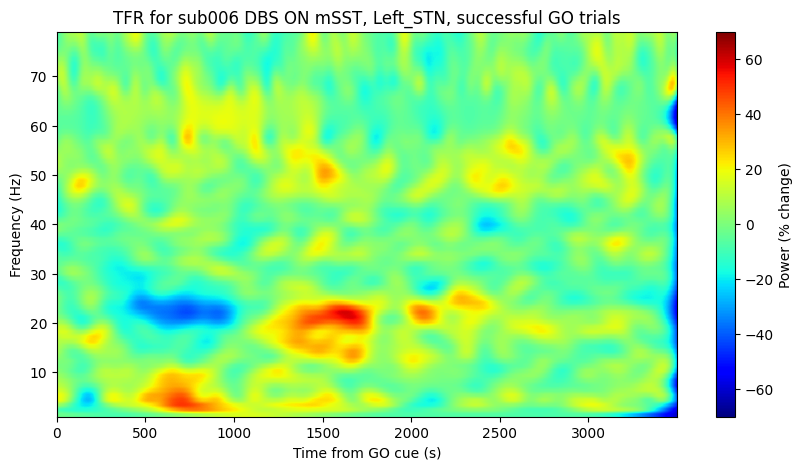

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished


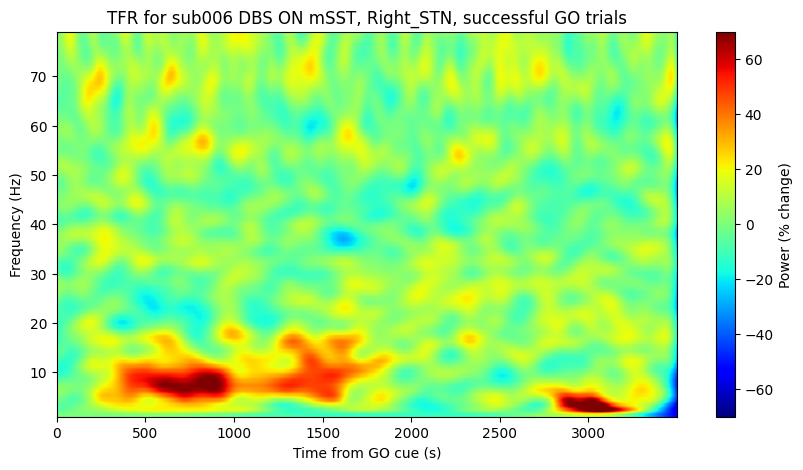

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


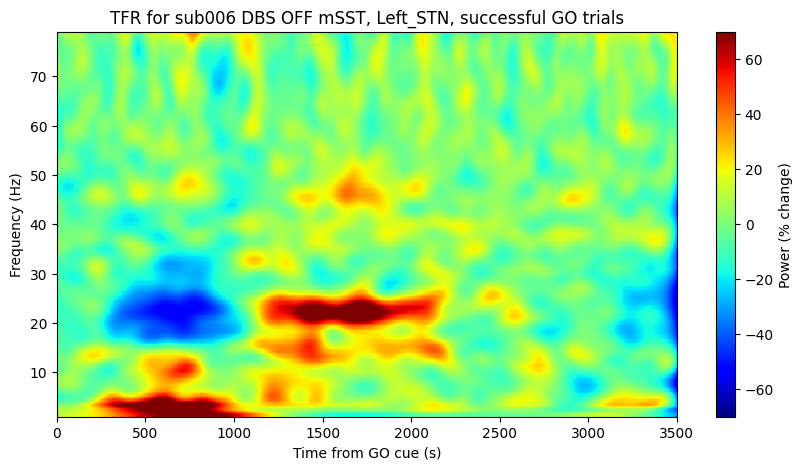

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


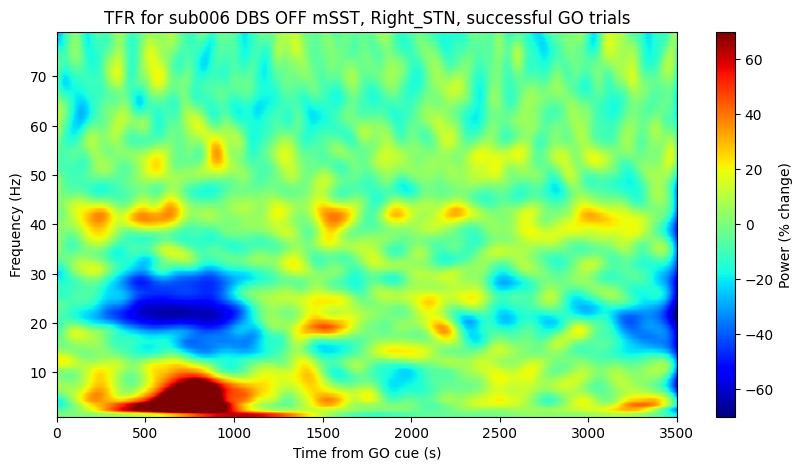

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished


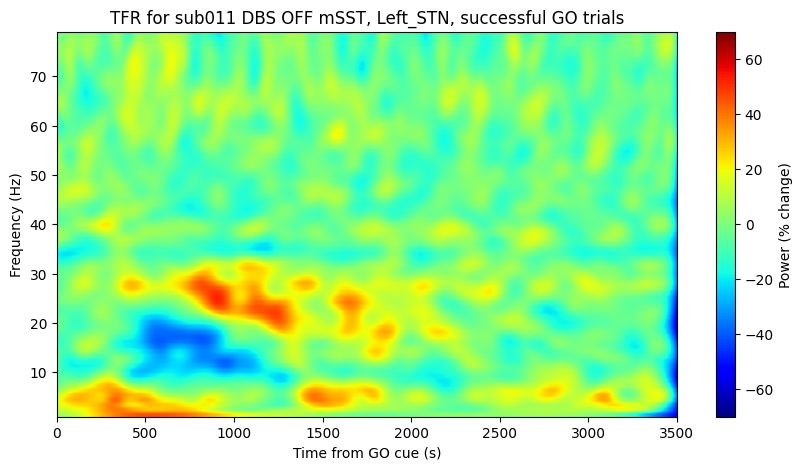

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s finished


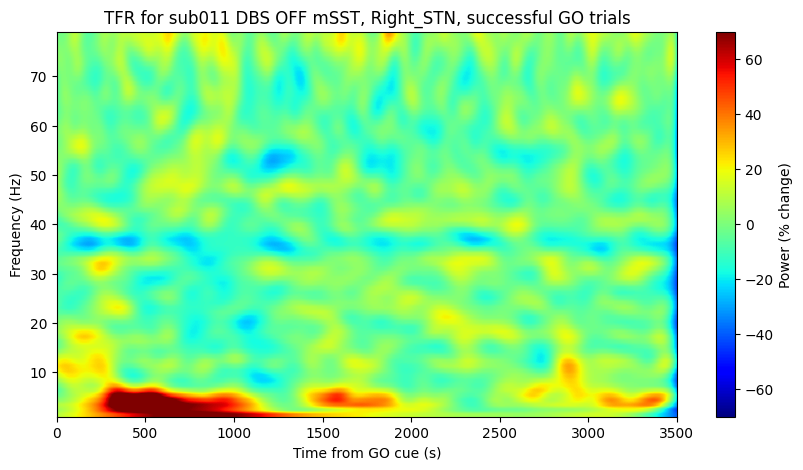

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


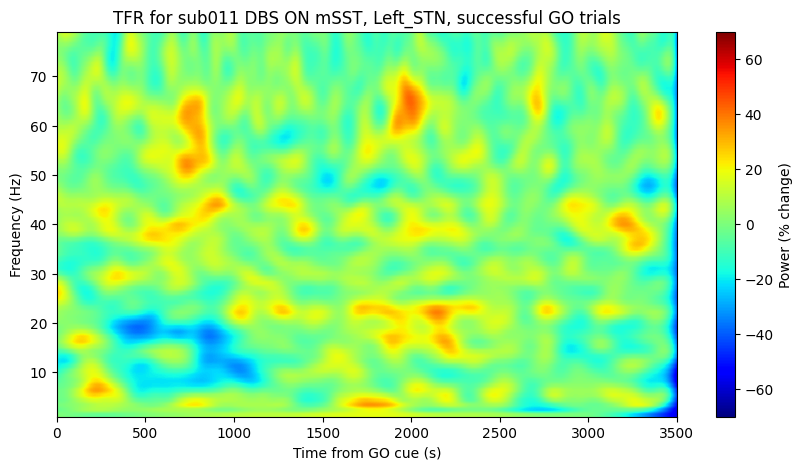

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


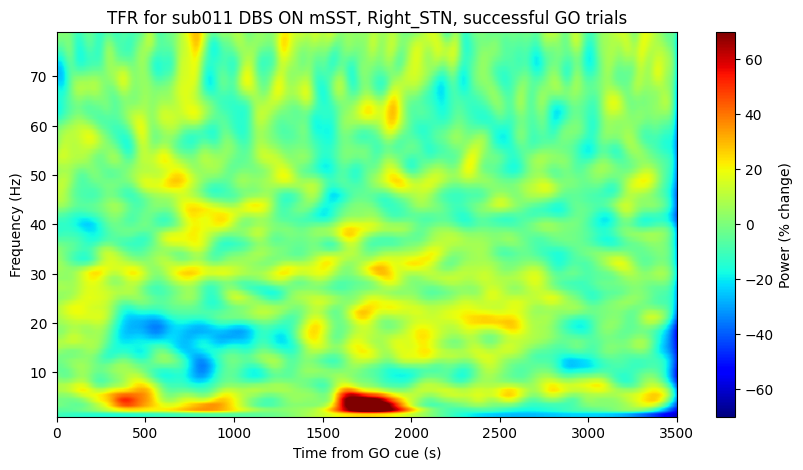

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


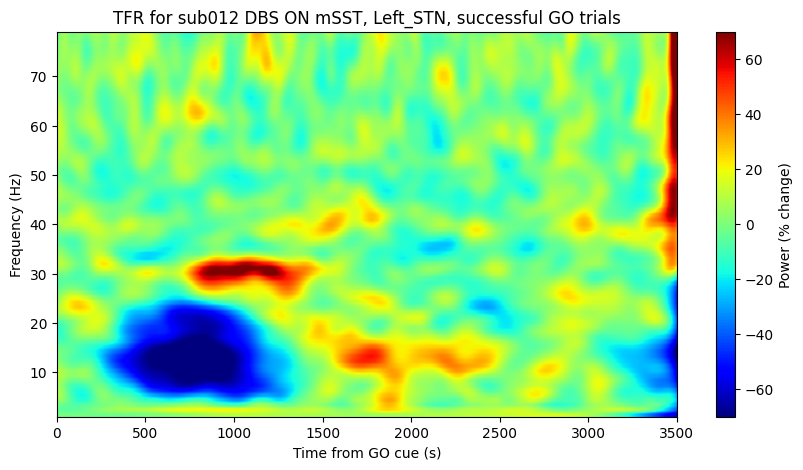

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


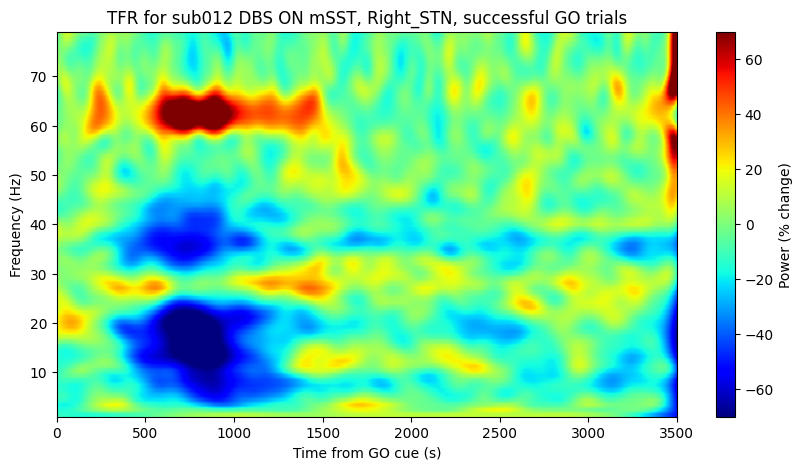

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


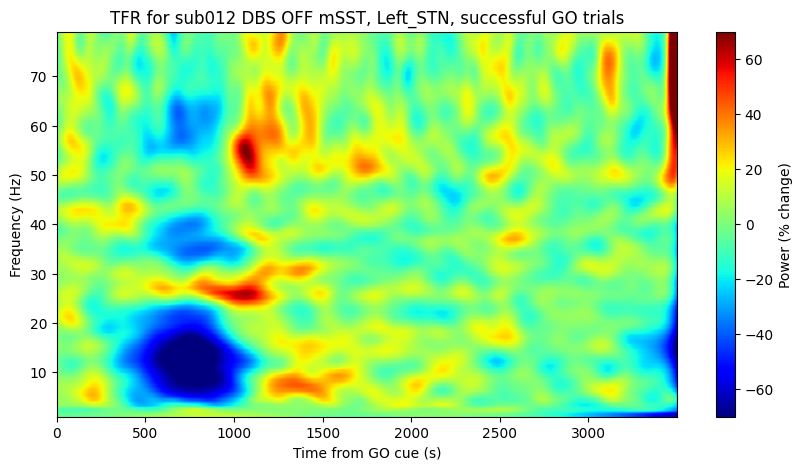

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


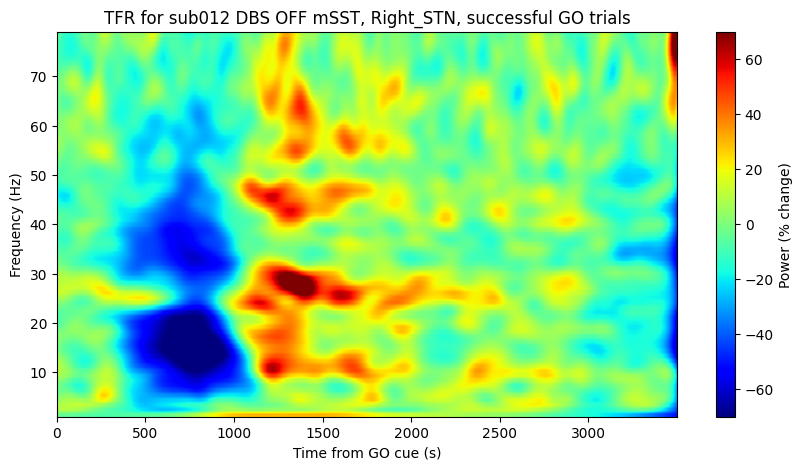

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished


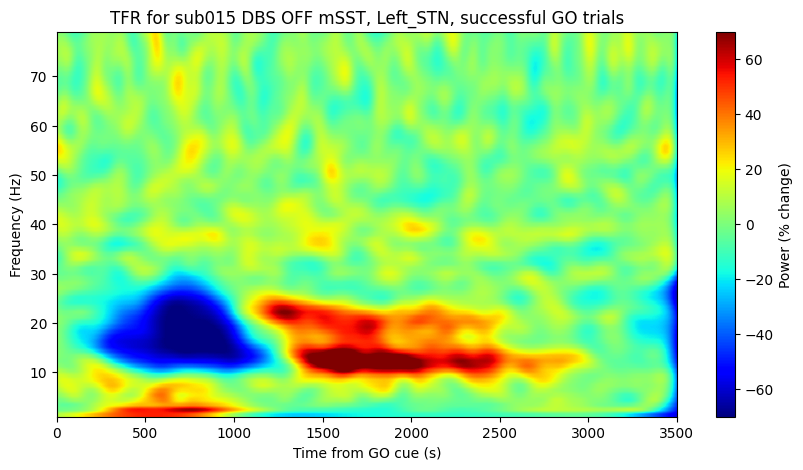

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished


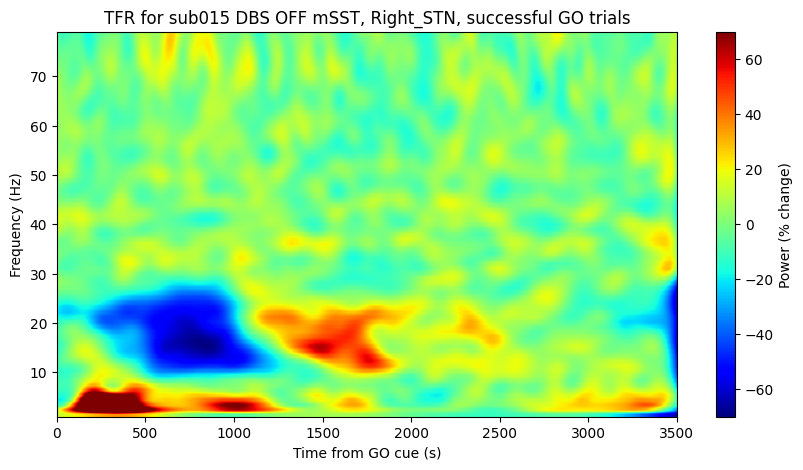

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


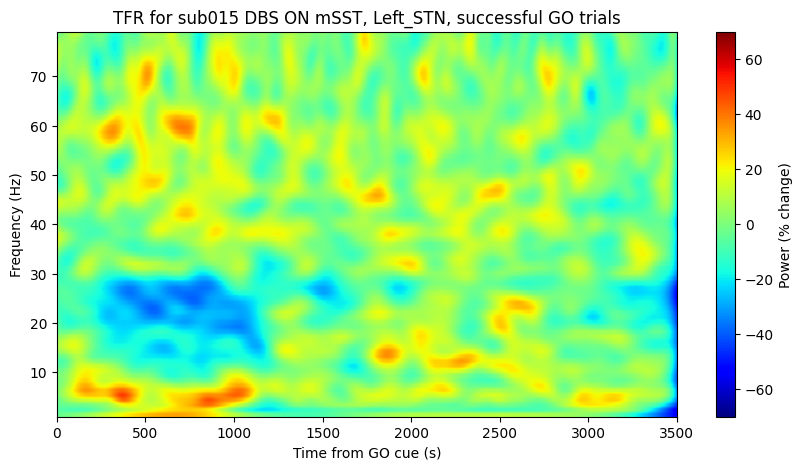

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


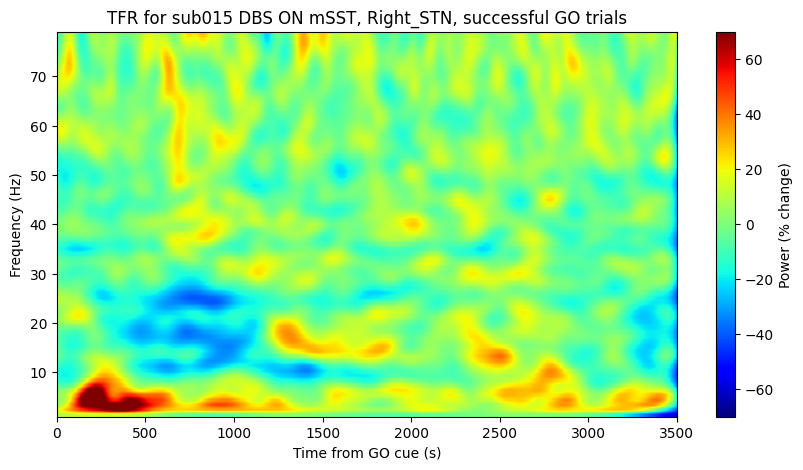

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished


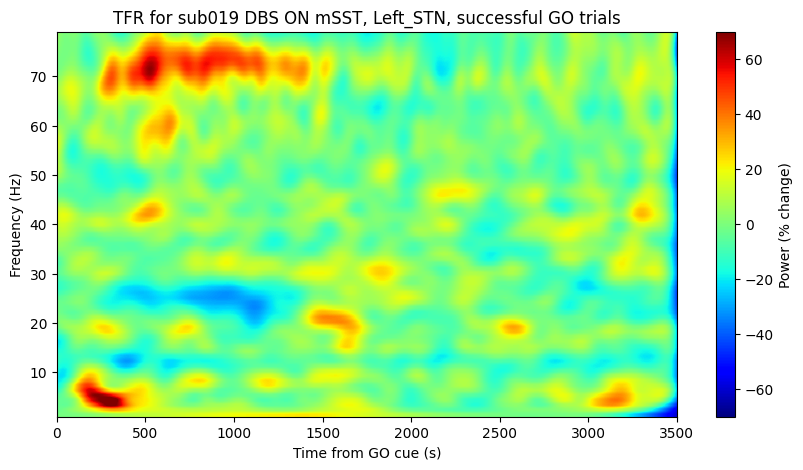

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished


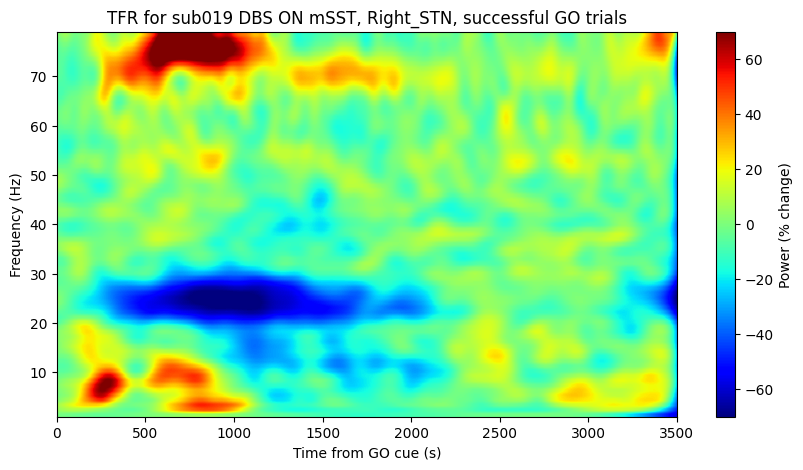

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


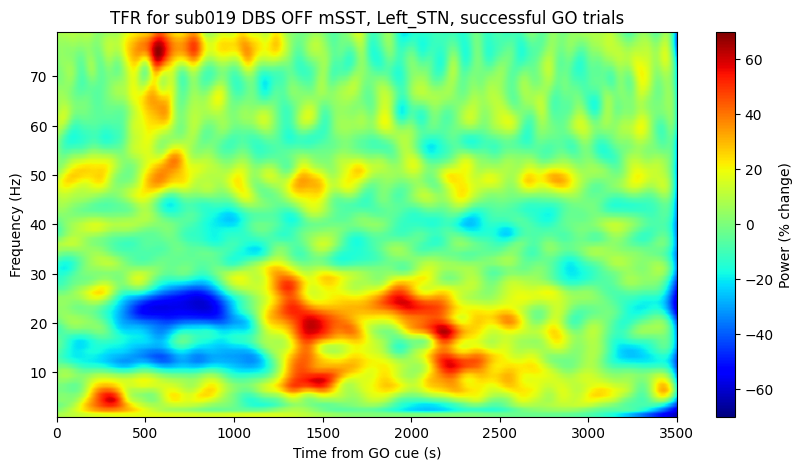

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


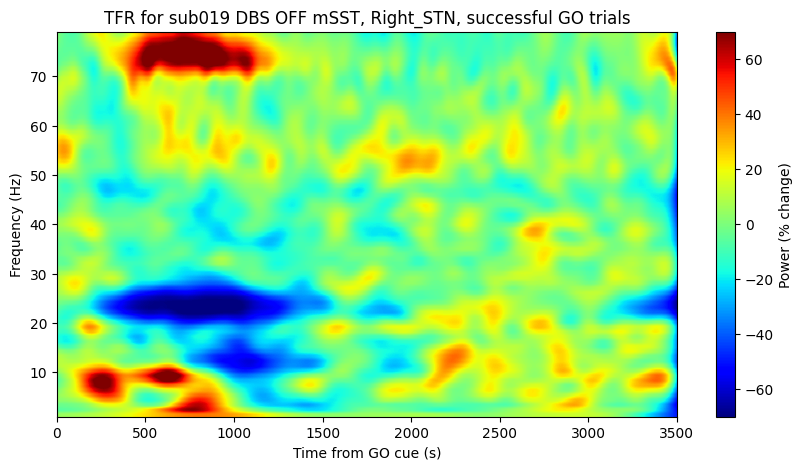

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


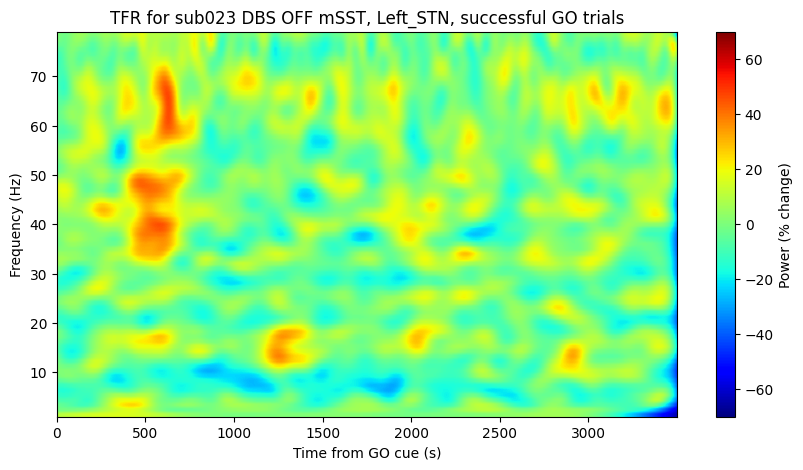

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


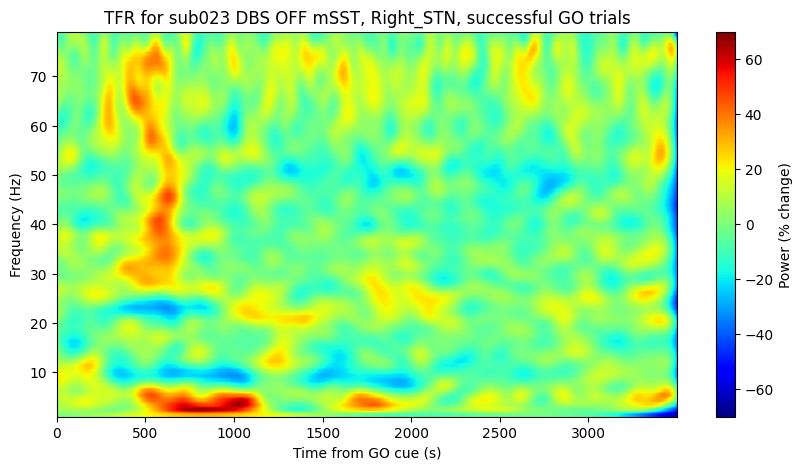

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


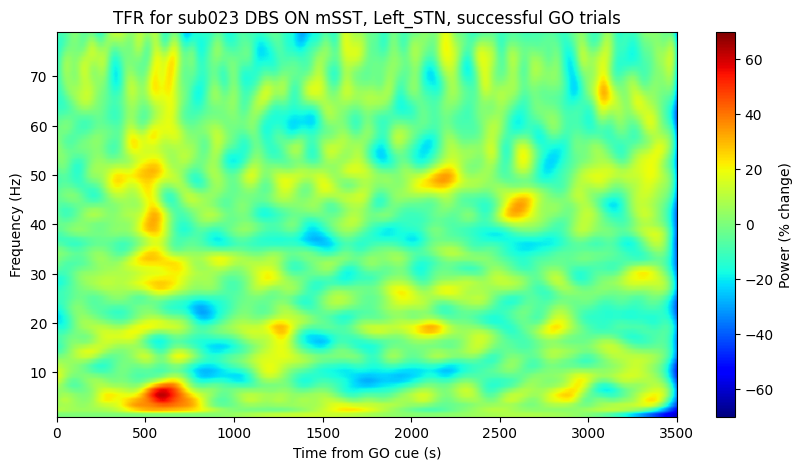

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


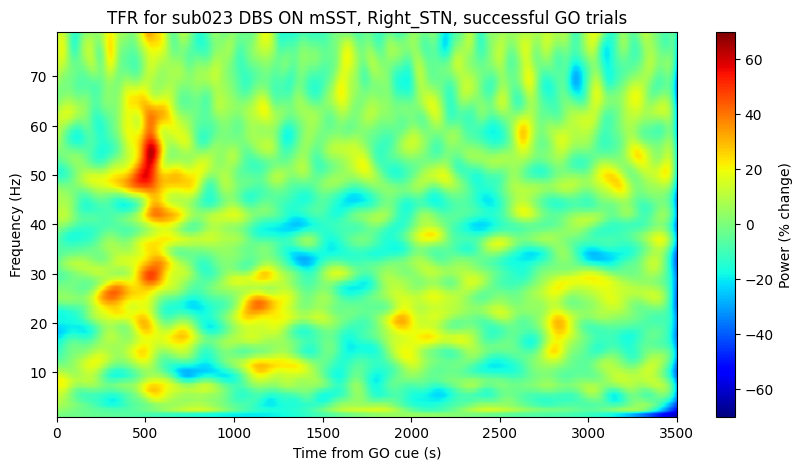

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s finished


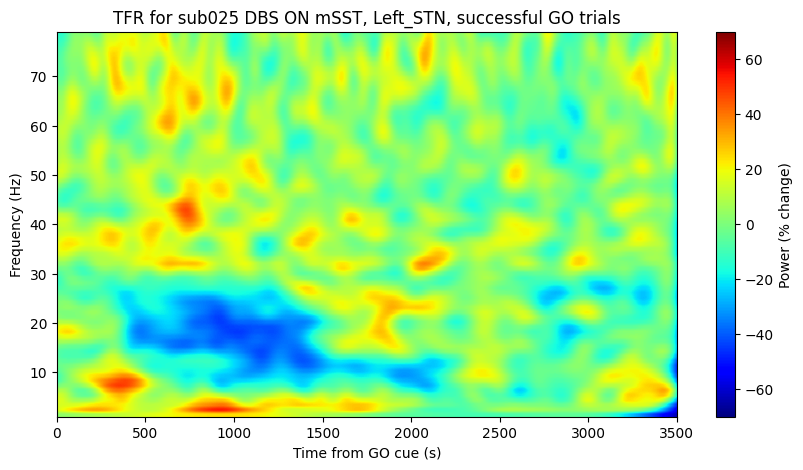

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


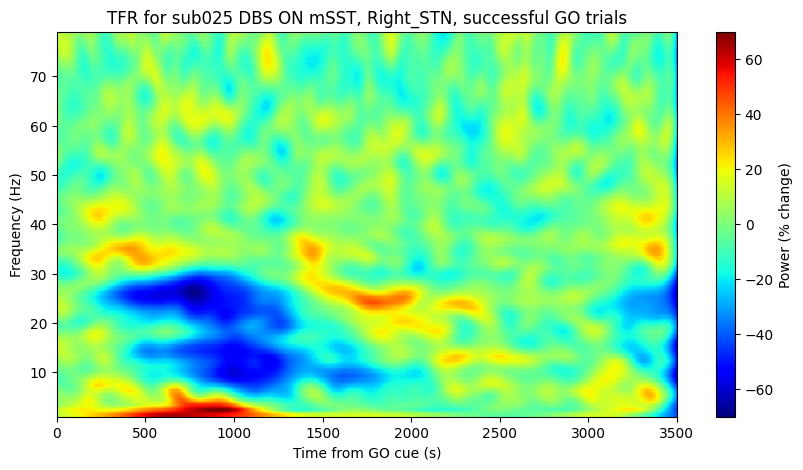

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


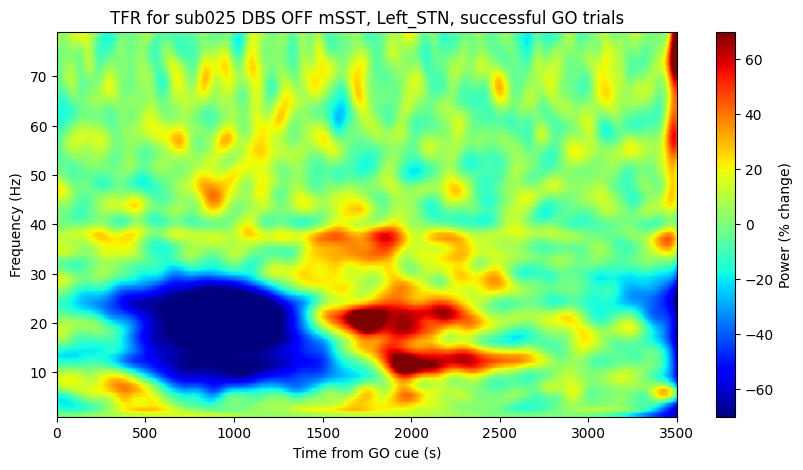

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


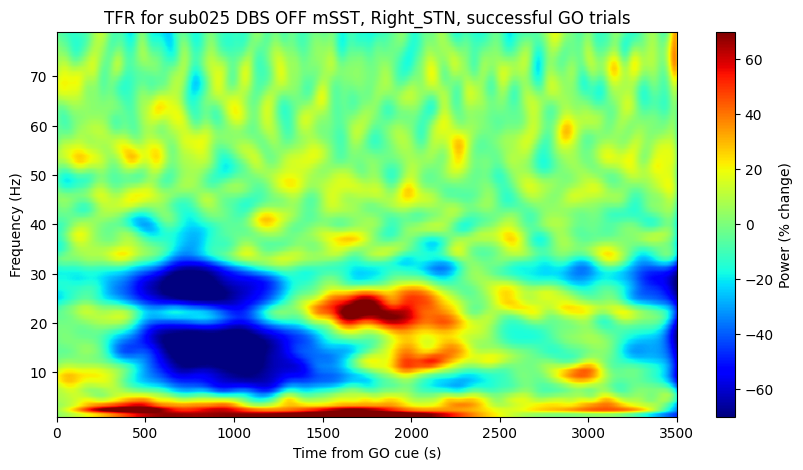

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished


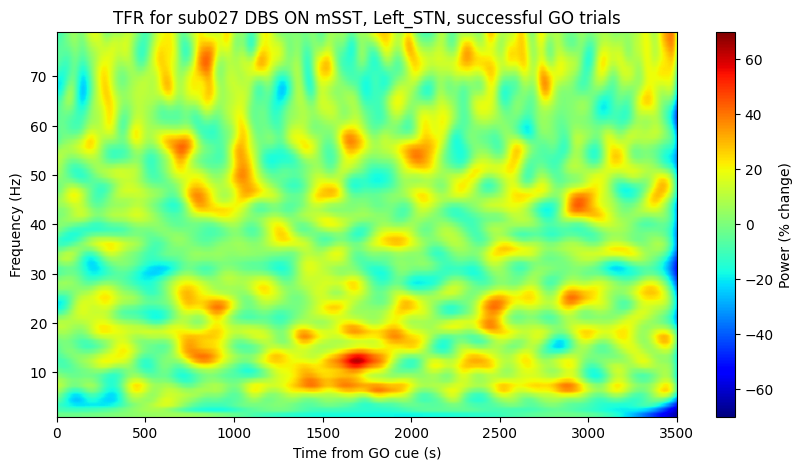

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished


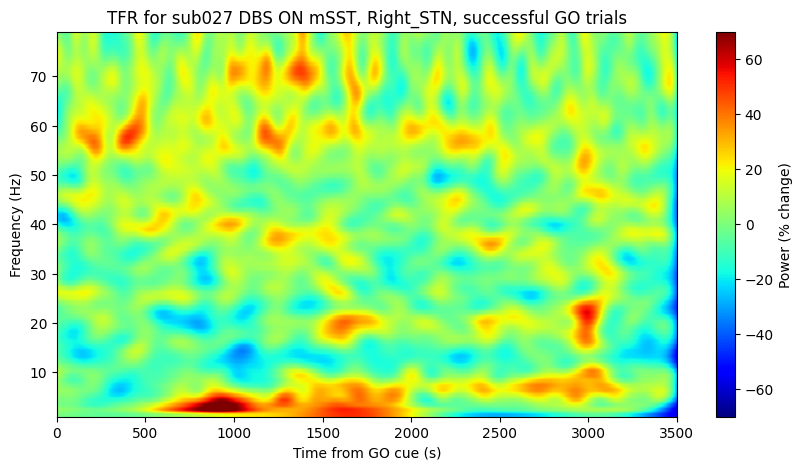

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


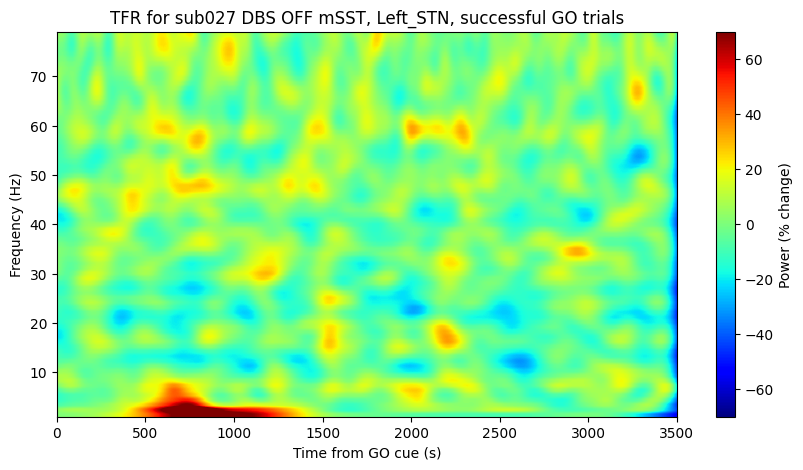

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


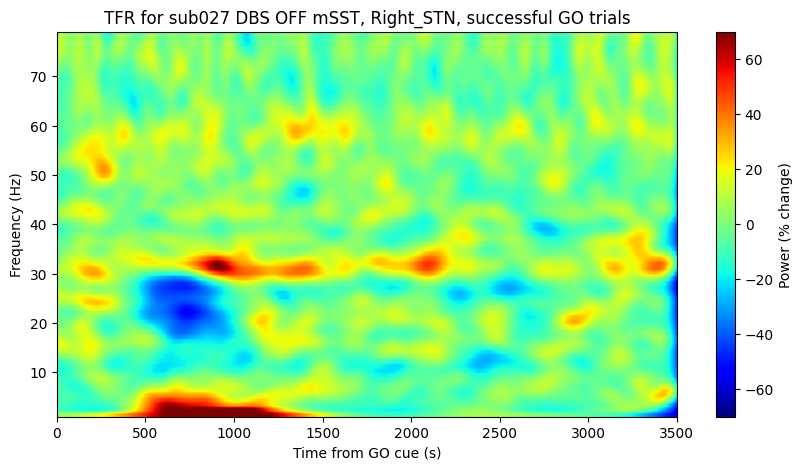

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


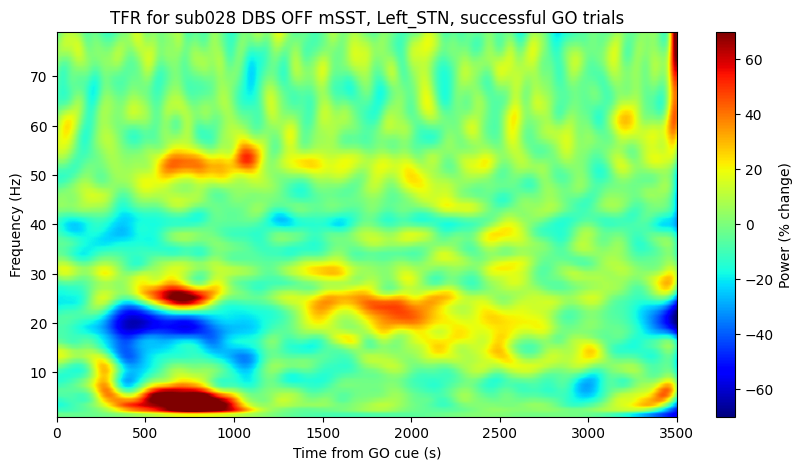

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


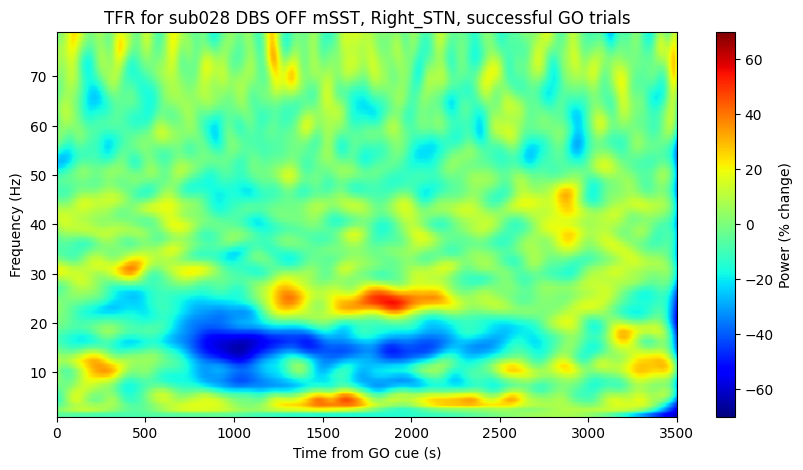

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished


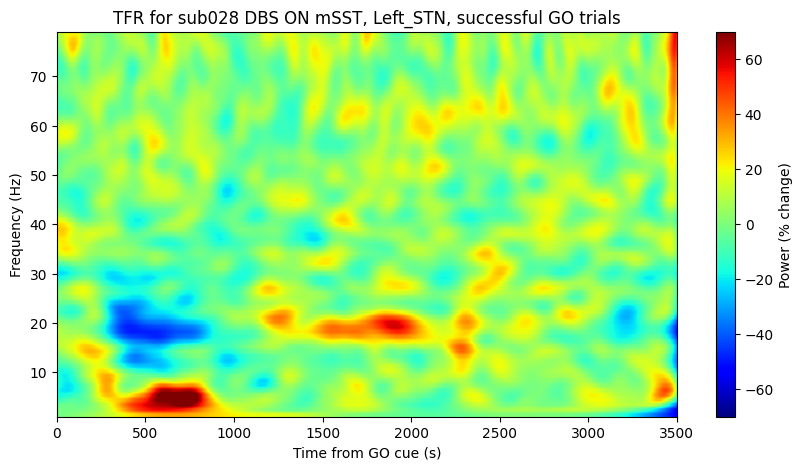

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


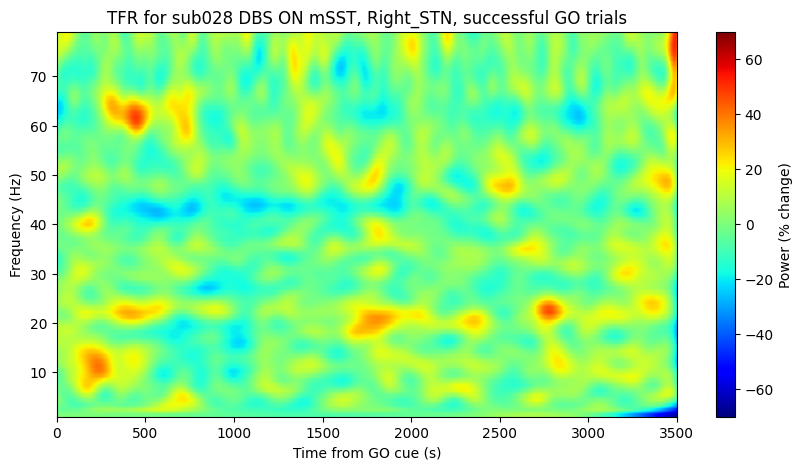

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished


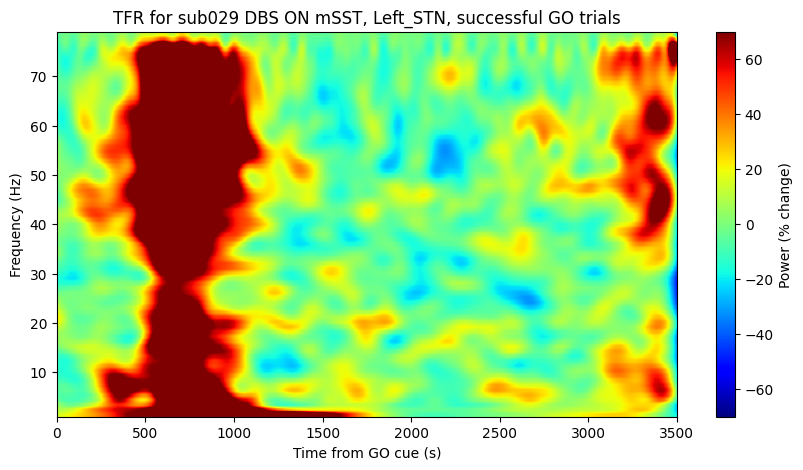

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished


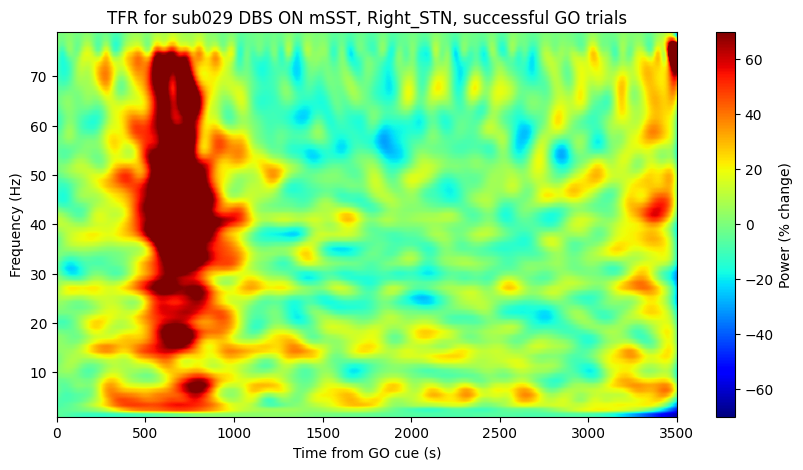

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished


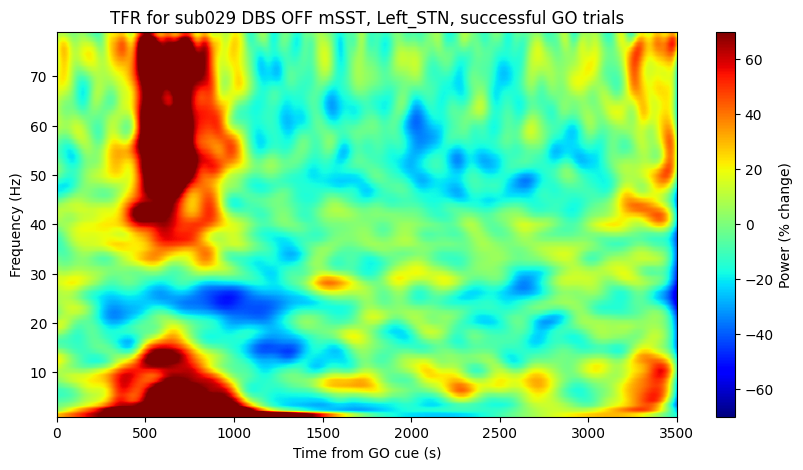

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished


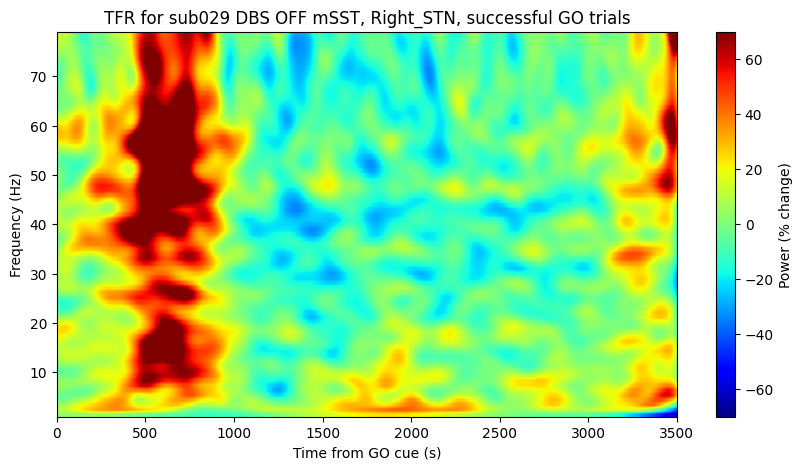

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


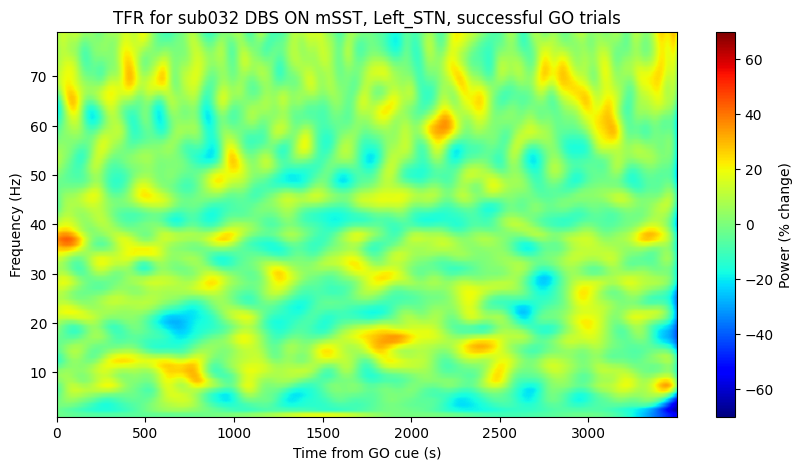

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


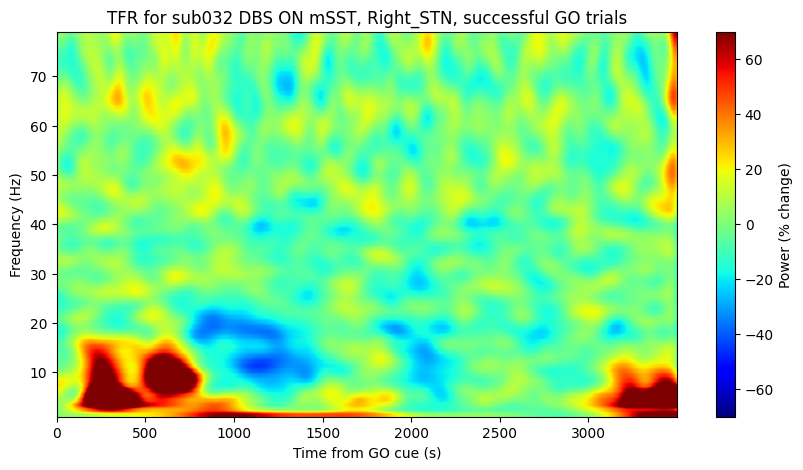

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished


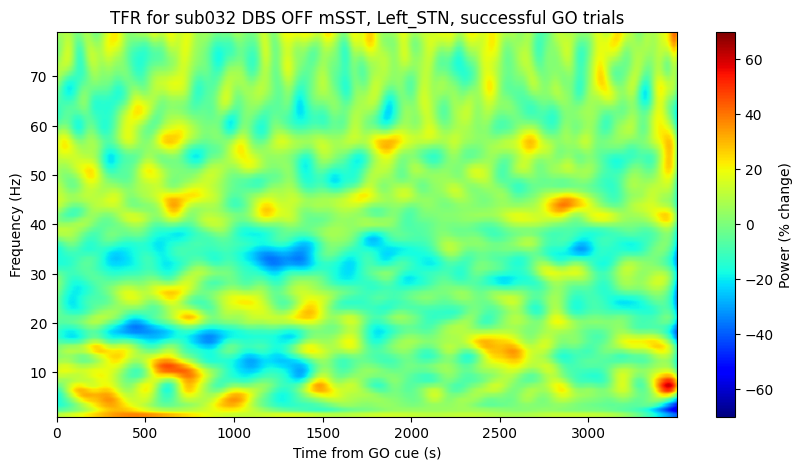

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished


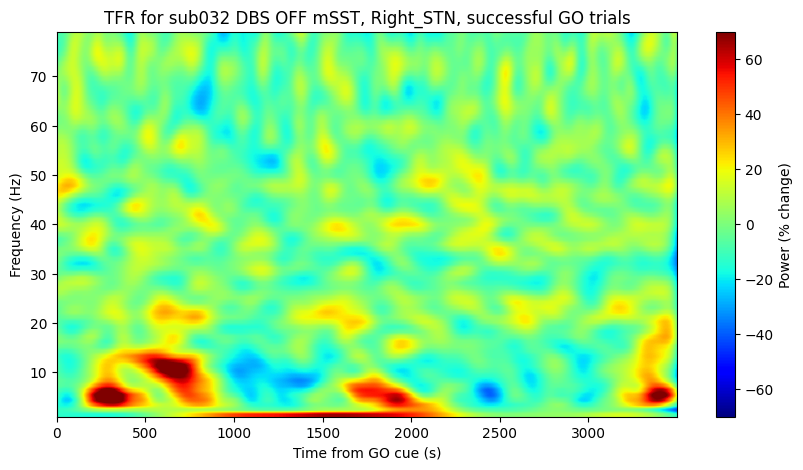

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


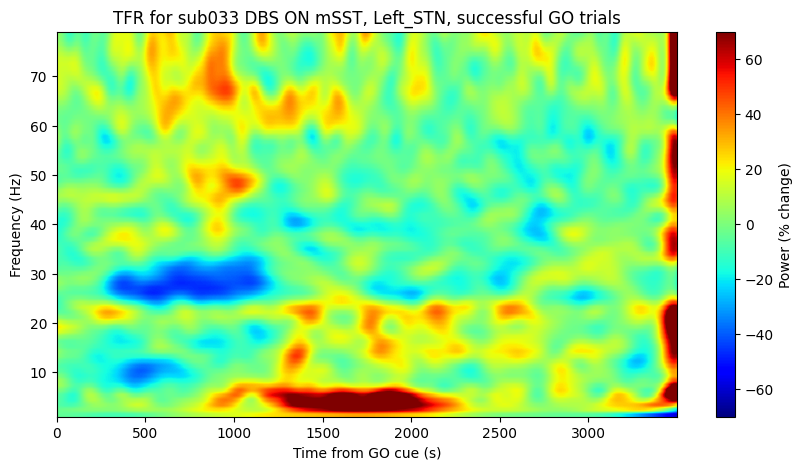

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


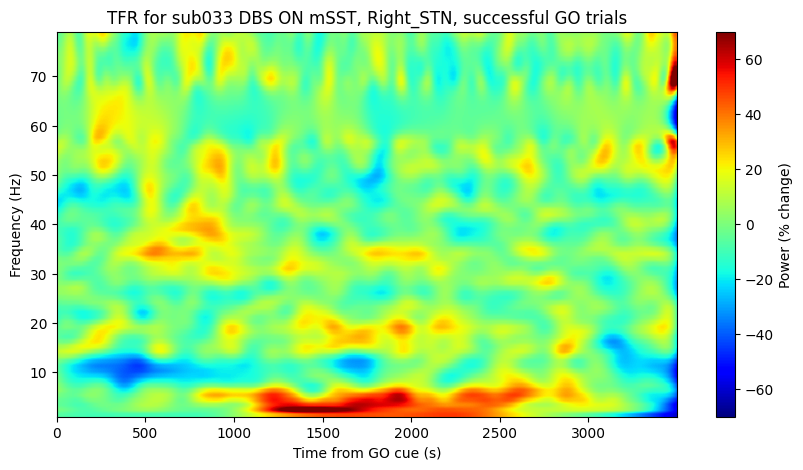

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


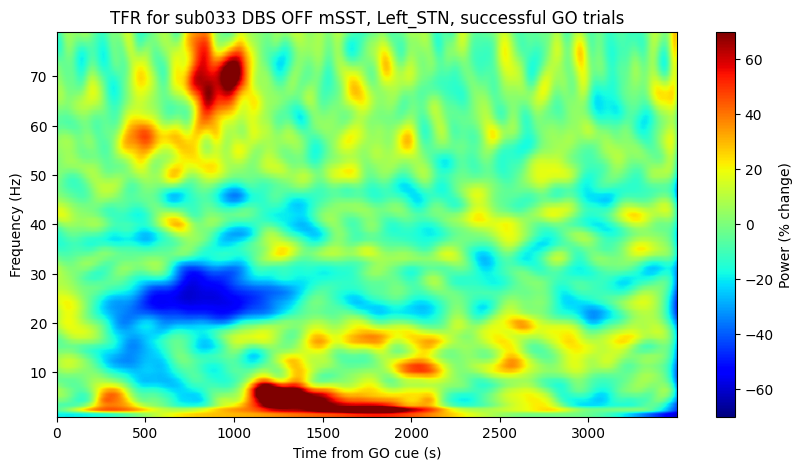

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


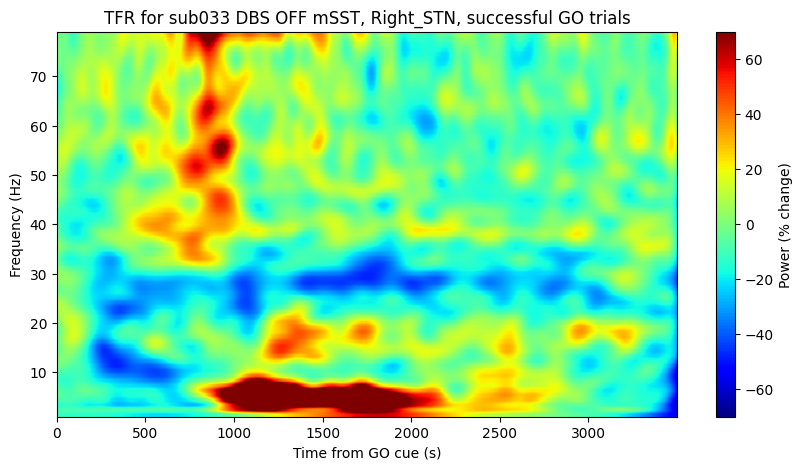

In [43]:
cond_of_interest = 'GO_successful_square'
ch_names = ['Left_STN', 'Right_STN']
for session_ID, epochs in sub_dict_epochs.items():
    for ch in ch_names:
        # Get TFR decomposition for successful GO trials
        change, times, freqs, mean_rt, mean_ssd = get_tfr_decomposition(
            epochs, 
            cond_of_interest, 
            ch, 
            tfr_args, 
            baseline_correction=True, 
            baseline_correction_method=baseline_correction_method, 
            tmin_tmax=tmin_tmax,
            threshold_GC=500  # example threshold for GC
        )

        # Plot the TFR
        plt.figure(figsize=(10, 5))
        plt.imshow(change, aspect='auto', origin='lower', cmap='jet', extent=[times[0], times[-1], freqs[0], freqs[-1]], vmin=vmin_vmax[0], vmax=vmin_vmax[1])
        plt.xlabel('Time from GO cue (s)')
        plt.ylabel('Frequency (Hz)')
        plt.title(f'TFR for {session_ID}, {ch}, successful GO trials')
        plt.colorbar(label='Power (% change)')
        plt.show()